<div style="border:solid green 2px; padding: 20px">
Михаил, привет!

Меня зовут Лена Кончева, я код-ревьюер твоего проекта. Предлагаю общаться на «ты», если это комфортно. Если нет — дай знать и перейдём на «вы». 

Это учебный проект, поэтому бояться ошибок не нужно. Моя задача не указать тебе на них, а помочь тебе стать аналитиком данных, поделившись своим опытом.

---

Я буду использовать комментарии разного цвета, пожалуйста, не изменяй и не удаляй их:

<div class="alert alert-block alert-danger">
    

### Комментарий от ревьюера №1 (необходимо исправить)

Такой комментарий используется для критичных ошибок, которые обязательно нужно исправить, иначе проект не будет принят
</div>
    
---

<div class="alert alert-block alert-warning">
    

### Комментарий от ревьюера №1 (можно лучше)


Такой комментарий указывает на некритичные ошибки или содержит рекомендации. Тебе решать, учитывать его в этом проекте или нет.
</div>

---

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №1 (ОК)

Такой комментарий указывает на удачные и красивые решения :)
</div>

---

Если ты что-то изменяешь в проекте по моим комментариям, пожалуйста, пиши об этом и выделяй описание каким-то заметным цветом. Так мне будет проще отследить изменения. Например, можно оформить вот так:

---

<div class="alert alert-block alert-info">
    

### Комментарий студента
Твой комментарий.

</div>

<div class="alert alert-block alert-info">
    

### Комментарий студента
Привет! Рад знакомству

</div>

# Исследование рынка заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены

Нужно подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места. Для этого выполнить шаги:

Шаг 1. Загрузите данные и изучите общую информацию

Шаг 2. Выполните предобработку данных

Шаг 3. Анализ данных

Шаг 4. Детализируем исследование: открытие кофейни

Шаг 5. Подготовка презентации

**Оглавление**

1. [Открытие данных](#start)
2. [Предобработка данных](#preprocessing) 
3. [Анализ данных](#analysis)
4. [Детальный анализ: открытие кофейни](#cafe)
5. [Презентация](#presentation)

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №1 (ОК)

У проекта есть название, в вводном блоке есть описание задачи 👍
</div>

In [1]:
# импорт библиотек
%pip install -U kaleido -q
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from plotly import graph_objects as go
import plotly.express as px
import folium
import numpy as np
import plotly.io as pio

pio.renderers.default = "png"


pd.set_option('display.max_rows', 500)

Note: you may need to restart the kernel to use updated packages.


## Открытие данных 
<a id="start"></a> 

In [2]:
# читаем файл и кладём в переменную
try:
    data = pd.read_csv('/datasets/moscow_places.csv')

except:
    display('File not found')

In [3]:
data.head(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [4]:
# смотрим общую информацию
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Видны пропуски в нескольких столбцах, также можно поменять тип данных в столбце с посадочными местами

**Описание данных:**

   `name` — название заведения;

   `address` — адрес заведения;

   `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;

   `hours` — информация о днях и часах работы;

   `lat` — широта географической точки, в которой находится заведение;

   `lng` — долгота географической точки, в которой находится заведение;

   `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

   `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

   `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
        «Средний счёт: 1000–1500 ₽»;
        «Цена чашки капучино: 130–220 ₽»;
        «Цена бокала пива: 400–600 ₽».
        и так далее;

   `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    
        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
    
   `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    
        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

   `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);

   `district` — административный район, в котором находится заведение, например Центральный административный округ;
    
   `seats` — количество посадочных мест.

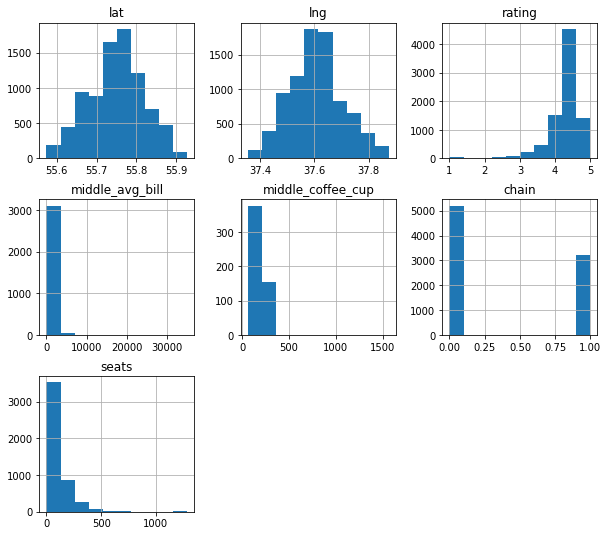

In [5]:
# строим распределение данных во всех столбцах таблицы
data.hist(figsize=(10,9));

В столбце seats заметно небольшое число аномальных значений, большее 1000, обработаем их ниже.

## Предобработка данных
<a id="preprocessing"></a> 

In [6]:
# проверка на дубликаты
data.duplicated().sum()

0

Дубликатов нет

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №2 (ОК)
Молодец, что не забываешь выполнять проверку на дубликаты! Также полезно выполнить проверку среди пар "название - адрес".
</div>

In [7]:
# подсчет числа пропусков
data.isna().mean().round(3)*100

name                  0.0
category              0.0
address               0.0
district              0.0
hours                 6.4
lat                   0.0
lng                   0.0
rating                0.0
price                60.6
avg_bill             54.6
middle_avg_bill      62.5
middle_coffee_cup    93.6
chain                 0.0
seats                43.0
dtype: float64

Видно большое число пропусков. Их в данном случае нельзя заполнить с помощью значений из других столбцов, поэтому оставляем как есть.

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №3 (ОК)
Верно, нет подходящего способа заполнить пропуски.
</div>

<div class="alert alert-block alert-danger">
    

### Комментарий от ревьюера №4 (необходимо исправить)
Заполнять 0 пропуски в столбце `seats` некорректно. Ведь мы не можем утверждать, что во всех этих заведениях 0 мест. Получим некорректную оценку среднего количества мест. Пропуски тут нужно оставить без заполнения.
    
Еще нужно поискать аномальные значения в столбце `middle_coffee_cup`.
</div>

<div class="alert alert-block alert-info">
    

### Комментарий студента
Понял, оставил пропуски. Добавил проверку middle_coffee_cup.

</div>

<AxesSubplot:>

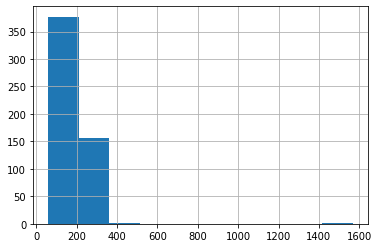

In [8]:
data['middle_coffee_cup'].hist()

In [9]:
data.query('middle_coffee_cup > 400')['name'].count()

1

Всего одно значение из 534, можно оставить, искажений быть не должно.

<div class="alert alert-block alert-warning">
    

### Комментарий от ревьюера №36 (2) (можно лучше)
Если посмотришь, что это за заведение, увидишь, что это ошибка)
</div>

In [10]:
data.query('middle_coffee_cup > 400')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0


In [11]:
# считаем число и долю аномальных значений
data.query('seats > 500')['name'].count()

56

In [12]:
(data.query('seats > 500')['name'].count() / data['seats'].count()).round(3)

0.012

Аномальных значений немного, около 1%, можно их оставить

**Задание. Создайте столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
    логическое значение `True` — если заведение работает ежедневно и круглосуточно;
    логическое значение `False` — в противоположном случае.**

In [13]:
# создаем столбец с круглосуточными кафе с ежедневной работой

data['is_24/7'] = data['hours'].apply(lambda x: True if x == 'ежедневно, круглосуточно' else False)

data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,False


**Задание. Создайте столбец `street` с названиями улиц из столбца с адресом.**

In [14]:
# извлекаем из строки название улиц без дополнительных символов
# ([А-я0-9\s]+)? любое количество цифр, букв, пробелов, идущих до и после слов улица|переулок|шоссе|площадь|проспект|проезд|бульвар|набережная|микрорайон|аллея|квартал|линия|тупик
data['street_name'] = (data['address']
                       .str.extract('(([А-яё0-9\s\-]+)?(улица|переулок|шоссе|площадь|проспект|проезд|бульвар|набережная|микрорайон|аллея|квартал|линия|тупик)([А-яё0-9\s]+)?)')[0])

display(data.head(10))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7,street_name
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,False,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,False,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,False,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,False,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,False,Правобережная улица
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,False,Ижорская улица
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,False,Клязьминская улица
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,False,Клязьминская улица
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,False,Дмитровское шоссе
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,False,Ангарская улица


Предобработка завершена. Пропуски в данных оставили как есть, тип данных заменен, дополнительные столбцы созданы.

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №5 (ОК)

Предобработка данных выполнена!
</div>

## Анализ данных
<a id="analysis"></a> 

In [15]:
# смотрим количество заведений по категориям
data['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

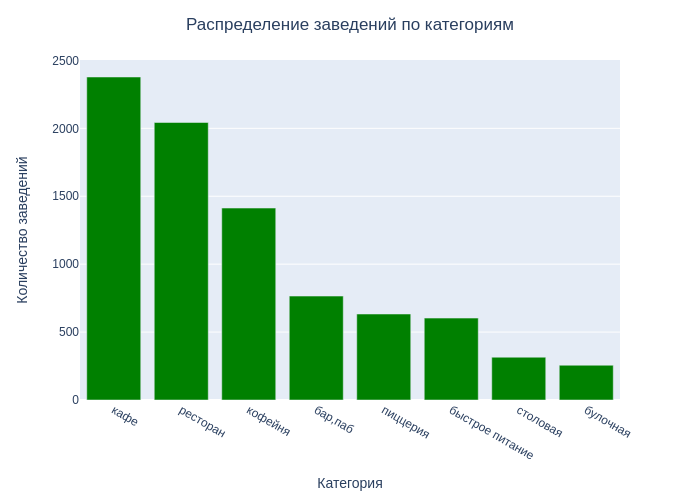

In [16]:
places_all = data.groupby('category').agg({'name':'count'}).reset_index().sort_values('name',ascending=False)

fig = px.bar(places_all,
             x='category',
             y='name',
             labels=({'category':'Категория', 'name':'Количество заведений'})
            )

fig.update_layout(title='Распределение заведений по категориям', title_x=0.5)
fig.update_traces(marker_color='green')
fig.show() 

<div class="alert alert-block alert-warning">
    

### Комментарий от ревьюера №6 (можно лучше)

При таком количестве категорий данный вид графика будет сложным к восприятию. На гистограмме без подписей можно было бы увидеть, как соотносятся значения. На пайчарте нужны подписи, а если без чтения цифр не обойтись, непонятно, зачем вообще нужен график.
</div>

<div class="alert alert-block alert-info">
    

### Комментарий студента
Построил гистограмму
</div>

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №37 (2) (ОК)

Такая визуализация подходит лучше 👍
</div>

Видно, что кафе в таблице больше всего, далее следуют рестораны и кофейни. Скорее всего, это наиболее популярные форматы.

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №7 (ОК)

Верно, кафе, ресторанов и кофеен больше всего. 
</div>

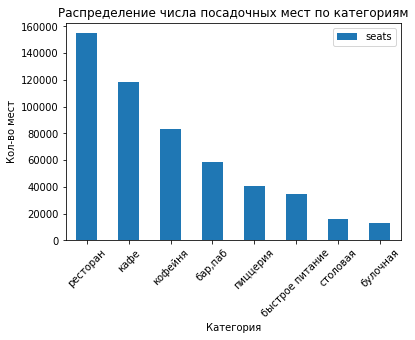

In [17]:
#строим распределение числа посадочных мест по категориям заведений
(data.pivot_table(index=['category'],
                 values=['seats'],
                 aggfunc='sum')
                .sort_values('seats', ascending=False)
                .plot(kind='bar')
)

plt.title('Распределение числа посадочных мест по категориям')
plt.xlabel('Категория')
plt.ylabel('Кол-во мест')
plt.xticks(rotation=45);

Можно отметить, что у ресторанов и кафе наибольшее число мест. Связано, скорее всего, с большими площадями помещений у ресторанов, вмещающие большее количество посетителей. В случае кафе связано с большим суммарным числом заведений.

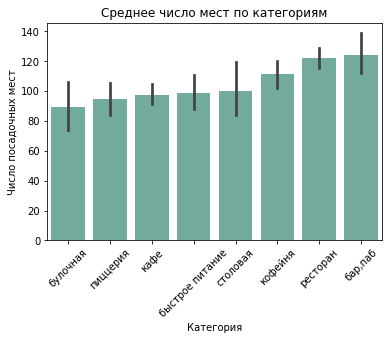

In [18]:
#найдем среднее число мест
for_sort = data.groupby(["category"])['seats'].mean().reset_index().sort_values('seats')

sns.barplot(data=data, x='category', y='seats', order=for_sort['category'], color='#69b3a2')
plt.title('Среднее число мест по категориям')
plt.xlabel('Категория')
plt.ylabel('Число посадочных мест')
plt.xticks(rotation=45);

<div class="alert alert-block alert-warning">
    

### Комментарий от ревьюера №8 (можно лучше)


Если на графике всего одна переменная и подписи однозначно обозначают каждую категорию, нет смысла раскрашивать каждый столбик в отдельный тон или оттенок. 

В данном случае цвет не несет дополнительной информации и может быть удален без ухудшения визуализации.
</div>

<div class="alert alert-block alert-info">
    

### Комментарий студента
Удалил раскраску
</div>

Можно увидеть, на какое число мест можно ориентировться в зависимости от категории при открытии нового заведения.

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №9 (ОК)

Верно, в ресторанах и пабах больше всего посадочных мест. 
</div>

In [19]:
# смотрим количество сетевых и несетевых заведений
data.groupby('chain')['name'].count()

chain
0    5201
1    3205
Name: name, dtype: int64

In [20]:
(data.groupby('chain')['name'].count()[0] / data.groupby('chain')['name'].count()[1]).round(3)

1.623

Несетевых заведений в таблице больше примерно на 63%

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №10 (ОК)

Верно, несетевых заведений гораздо больше!
</div>

In [21]:
# сгруппируем данные по категориям и признаку сетевые-несетевые
chain = (data
         .groupby(['category','chain'])['name']
         .count()
         .reset_index()
         .sort_values('name', ascending=False)
        )

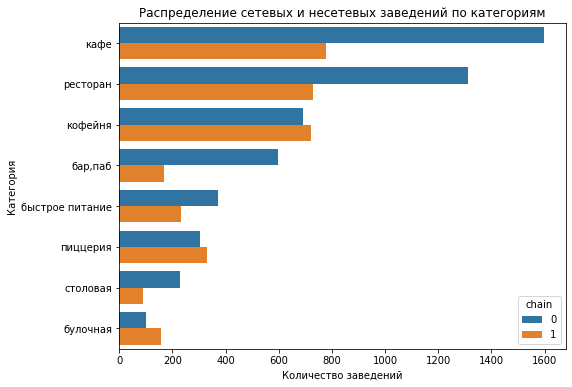

In [22]:
# строим визуализацию 
plt.figure(figsize=(8, 6))
sns.barplot(x='name', y='category', data=chain, hue='chain')
plt.title('Распределение сетевых и несетевых заведений по категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Категория');

Сетевые кофейни, пиццерии и булочные примерно поровну соотносятся с несетевыми. Кафе, рестораны, бары и заведения быстрого питания, а также столовые чаще являются несетевыми. Можно предположить, что в этих категориях есть перспектива развития франшизы.

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №11 (ОК)

Среди кофеен, пиццерий и булочных больше сетевых заведений.
</div>

In [23]:
# найдем топ-15 количества сетевых заведений
top15 = data['name'].value_counts().head(15)

top15

Кафе                                   189
Шоколадница                            120
Домино'с Пицца                          76
Додо Пицца                              74
One Price Coffee                        71
Яндекс Лавка                            69
Cofix                                   65
Prime                                   50
Хинкальная                              44
Шаурма                                  43
КОФЕПОРТ                                42
Кулинарная лавка братьев Караваевых     39
Теремок                                 38
Чайхана                                 37
Ресторан                                34
Name: name, dtype: int64

Видно, что в топ попадают названия Кафе, Ресторан, Столовая. Вряд ли каждое из них принадлежит одной сети, скорее всего это небольшие одиночные места, поэтому их отфильтруем. Яндекс Лавка это доставка еды, также исключим из топа.

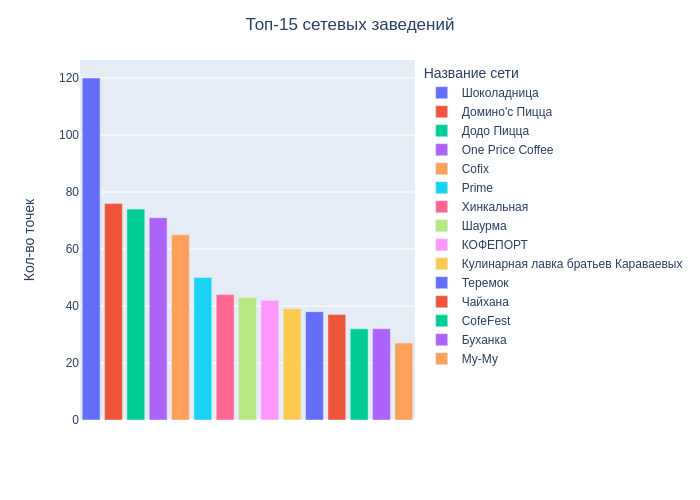

In [24]:
top15 = (data
         .query
         (
             'name not in ["Яндекс Лавка", "Кафе","Ресторан","Столовая"]'
         )
         ['name']
         .value_counts()
         .head(15)
        )

fig = px.bar(top15, color=top15.index, labels={'value':'Кол-во точек','index':'Название сети'})
fig.update_layout(title='Топ-15 сетевых заведений',
                  title_x=0.5)
fig.update_xaxes(showticklabels=False,
                 title_font=dict(color='white'))
fig.show()

Получаем список основных конкурентов. Шоколадница лидирует по количеству точек

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №12 (ОК)

Шоколадница - лидер по количеству заведений.
</div>

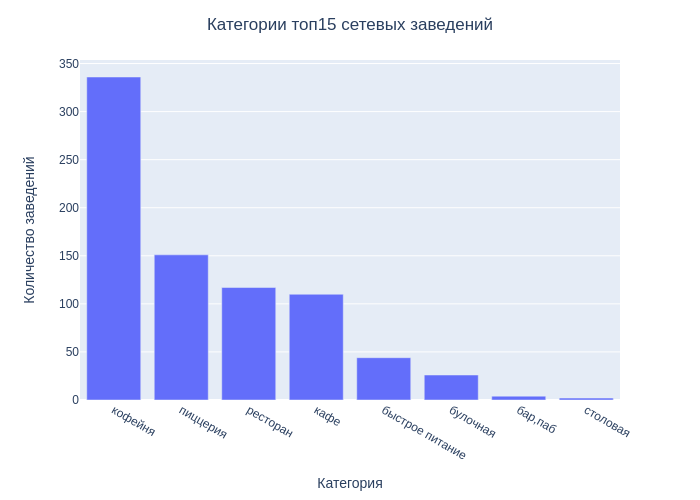

In [25]:
# смотрим категории топ15 сетевых заведений
top15_cat = (data
             .query('name in @top15.index')
             .groupby(['category'])
             .count()
             .reset_index()
             [['category','name']]
             .sort_values('name', ascending=False)
            )

fig = px.bar(top15_cat,
             x='category',
             y='name',
             labels={'name':'Количество заведений','category':'Категория'}
            )
fig.update_layout(title='Категории топ15 сетевых заведений',title_x=0.5)
fig.show()

Можно сказать, что топ 15 популярных сетевых заведений относятся в основном к категории кофеен, пиццерий, ресторанов и кафе.

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №13 (ОК)

Среди самых популярных сетей больше всего кофеен.
</div>

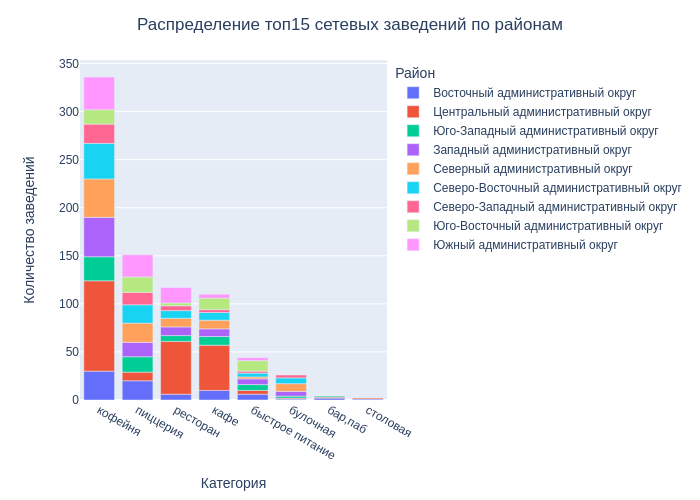

In [26]:
# смотрим распределение топ15 сетевых заведений по районам
top15_distr = data.query('name in @top15.index').groupby(['category','district']).agg({'name':'count'}).reset_index()

fig = px.bar(top15_distr,
             x='category',
             y='name',
             color='district',
             labels={'name':'Количество заведений','district':'Район', 'category':'Категория'}
            )

fig.update_layout(xaxis={'categoryorder':'total descending'},
                 title='Распределение топ15 сетевых заведений по районам',
                 title_x=0.5)
fig.show()

Кафе, кофейни и рестораны топ15 сетей, в основном, расположены в центре, пиццерии по большей части расположены вокруг центра.

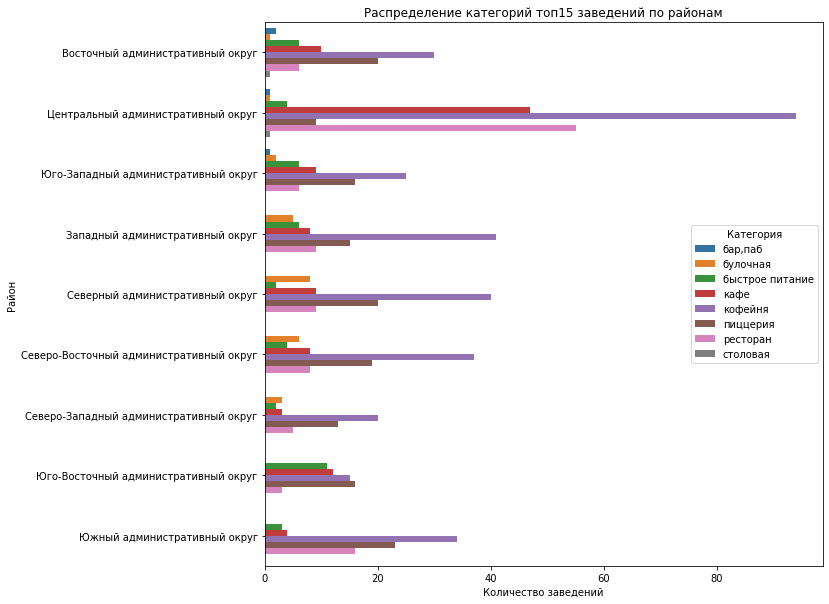

In [27]:
plt.figure(figsize=(10,10))

sns.barplot(x='name',y='district', data=top15_distr, hue ='category')
plt.title('Распределение категорий топ15 заведений по районам')
plt.ylabel('Район')
plt.xlabel('Количество заведений')
plt.legend(loc='center right', title='Категория');

<div class="alert alert-block alert-danger">
    

### Комментарий от ревьюера №14 (необходимо исправить)
Неудачное визуальное решение. Совсем не видим, как распределены по районам бары и столовые. Лучше использовать такой же тип графика, какой ты используешь ниже.
</div>

<div class="alert alert-block alert-info">
    

### Комментарий студента
Перерисовал график</div>

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №38 (2) (ОК)

Можем сопоставить распределение по категориям и по районам. 👍
</div>

In [28]:
# смотрим, какие районы представлены в таблице
data['district'].value_counts()

Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

Видно, что основная доля заведений расположена в центре.

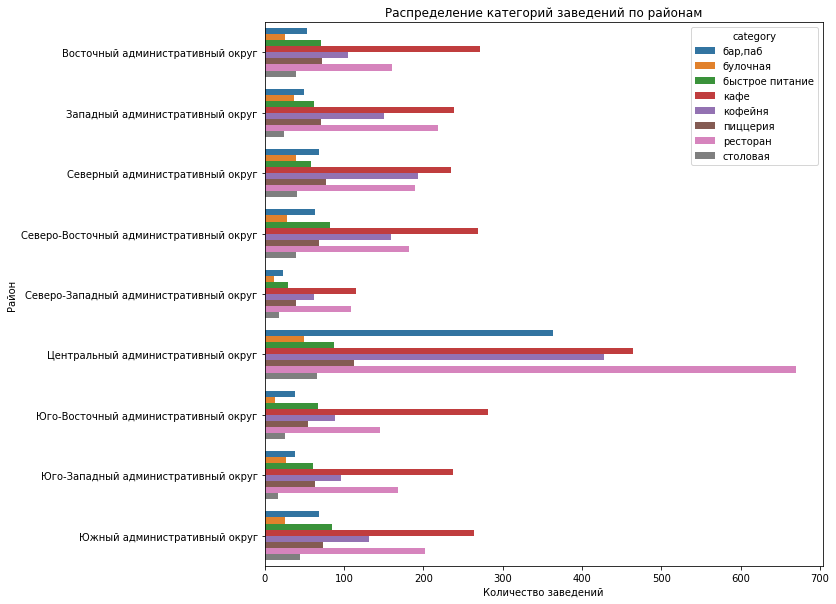

In [29]:
# группируем данные по району и категориям, строим график
cat_distr = data.groupby(['district','category'])['name'].count().reset_index()

plt.figure(figsize=(10,10))

sns.barplot(x='name',y='district', data=cat_distr, hue ='category')
plt.title('Распределение категорий заведений по районам')
plt.ylabel('Район')
plt.xlabel('Количество заведений');

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №15 (ОК)

Удачная визуализация 👍 Можем сопоставить распределение по категориям и по районам.
</div>

Видно, что в центре представлена большая часть категорий заведений.

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №16 (ОК)

В Центральном административном округе значительно больше заведений, чем в остальных районах. В целом, типы заведений распределены по районам похожим образом. 
</div>

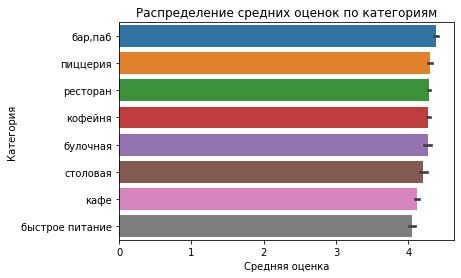

In [30]:
# строим распределение средних оценок по категориям
for_sort = (data
            .groupby(["category"])['rating']
            .mean()
            .reset_index()
            .sort_values('rating',ascending=False)
           )

sns.barplot(data=data, y='category', x='rating', order=for_sort['category'])
plt.title('Распределение средних оценок по категориям')
plt.ylabel('Категория')
plt.xlabel('Средняя оценка');

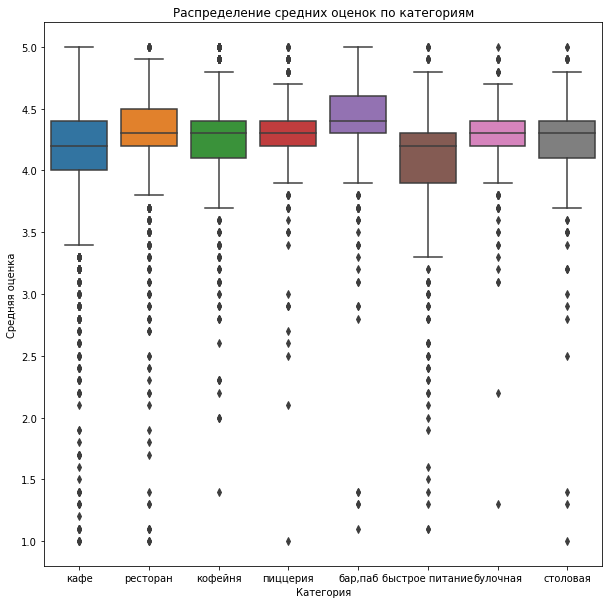

In [31]:
plt.figure(figsize=(10,10))

sns.boxplot(data=data, x='category', y='rating')
plt.title('Распределение средних оценок по категориям')
plt.xlabel('Категория')
plt.ylabel('Средняя оценка');

У кафе, ресторанов, быстрого питания видно большое число выбросов. Кофейны, пиццерии, бары, столовые и булочные чуть более "стабильны". Вероятно, связано с меньшим разнообразием меню. У баров самая высокая медианная оценка.

<div class="alert alert-block alert-danger">
    

### Комментарий от ревьюера №17 (необходимо исправить)
Такой тип графика здесь не очень информативен. Было бы полезно на графике показать разброс значений и выбросы для каждой категории.
</div>

<div class="alert alert-block alert-info">
    

### Комментарий студента
Построил диаграмму размаха</div>

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №39 (2) (ОК)

Такой тип графика лучше подходит 👍
</div>

In [32]:
for_sort.round(2)

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


Видно, что средняя оценка всех заведений больше 4. У пиццерий, ресторанов, кофеен и булочных оценки практически одинаковые. Самые низкие средние оценки у кафе и фаст фуд заведений. Разница между максимальным и минимальным рейтингом около 0.34 балла

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №18 (ОК)

Самый высокий средний рейтинг у баров и пабов, самый низкий у фастфуд-точек. 
</div>

In [33]:
# строим хороплет со средними оценками по районам

from folium import Map, Choropleth
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data.groupby('district').agg({'rating':'mean'}).reset_index(),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Заведения в центре, похоже, оценивают выше. Скорее всего, это связано с высокой конкуренцией и большой проходимостью.

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №19 (ОК)

В ЦАО не только больше всего заведений, но и самый высокий рейтинг!
</div>

In [34]:
# построим распределение количества заведений по районам на карте

# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Наибольшая плотность заведений находится, в основном, внутри ТТК.

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №20 (ОК)

Такая визуализация позволяет увидеть все объекты на карте 👍
</div>

In [35]:
# находим топ15 улиц по количеству заведений
top15_streets = data.groupby(['street_name'])['name'].count().reset_index().sort_values('name', ascending=False).head(15)

top15_streets

,street_name,name
1038,проспект Мира,184
757,Профсоюзная улица,122
1035,проспект Вернадского,108
513,Ленинский проспект,107
511,Ленинградский проспект,95
363,Дмитровское шоссе,88
444,Каширское шоссе,77
291,Варшавское шоссе,76
512,Ленинградское шоссе,70
534,Люблинская улица,60


In [36]:
# фильтруем исходную таблицу по топ15 улицам, группируем по категориям
data_top15 = (data
              .query('street_name in @top15_streets.street_name')
              .groupby(['street_name','category'])['name']
              .count()
              .reset_index()
              .sort_values('name', ascending=False)
             )

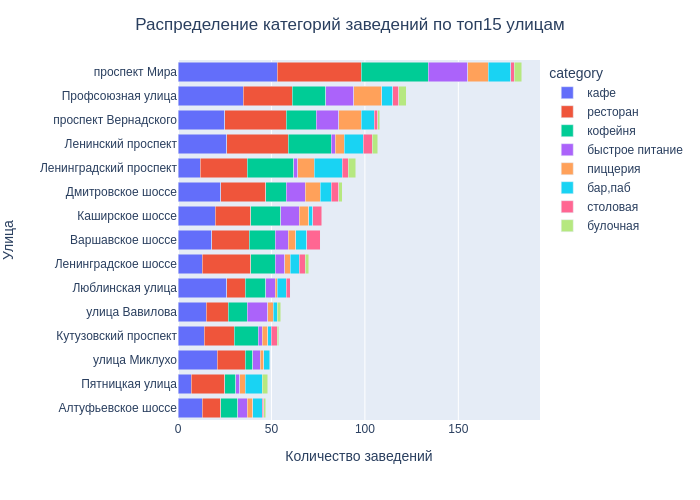

In [37]:
# строим диаграмму распределения категорий заведений по топ15 улицам
fig = px.bar(
    data_top15,
    x="name",
    y="street_name",
    color="category",
    labels={'street_name':'Улица','name':'Количество заведений'}
)

fig.update_layout(barmode='stack',
                  yaxis={'categoryorder':'total ascending'},
                 title='Распределение категорий заведений по топ15 улицам',
                 title_x=0.5)

fig.show()

Проспект мира лидирует по общему количеству заведений и по их категориям.

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №21 (ОК)

Почти все улицы-лидеры по количеству заведений имеют большую протяженность.
</div>

In [38]:
# находим улицы только с одним заведением и наносим их на карту районов

places_cnt = data.groupby(['street_name'])['name'].count().reset_index().sort_values('name')

single_place = places_cnt.query('name == 1')

In [39]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.query('street_name in @single_place.street_name').apply(create_clusters, axis=1)

# выводим карту
m

In [40]:
(data
 .query('street_name in @single_place["street_name"]')
 .groupby(['district'])
 .agg({'name':'count'})
 .reset_index()
 .sort_values('name',ascending=False)
)

,district,name
5,Центральный административный округ,136
0,Восточный административный округ,48
2,Северный административный округ,48
3,Северо-Восточный административный округ,48
8,Южный административный округ,39
1,Западный административный округ,37
6,Юго-Восточный административный округ,37
4,Северо-Западный административный округ,19
7,Юго-Западный административный округ,14


В центре улиц с одним заведением большинство, 136 заведений. Видимо, связано с тем, что там много коротких улиц и переулков. Также они распределены по всей Москве.

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №22 (ОК)
Большая часть улиц с одним заведением находится в ЦАО. Действительно, здесь много улиц с небольшой протяженностью.
</div>

In [41]:
# смотрим категории заведений 

(data
 .query('street_name in @single_place.street_name')
 .groupby(['category'])
 .agg({'name':'count'})
 .reset_index()
 .sort_values('name',ascending=False)
)

,category,name
3,кафе,143
6,ресторан,90
4,кофейня,75
0,"бар,паб",40
7,столовая,37
2,быстрое питание,18
5,пиццерия,14
1,булочная,9


Одиночные заведения в основном представлены в категориях кафе, ресторанов, кофеен и баров, столовых.

In [42]:
#строим хороплет с распределением среднего чека по районам

from folium import Map, Choropleth
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)



# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data.groupby('district').agg({'middle_avg_bill':'median'}).reset_index(),
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.5,
    legend_name='Средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Самые дорогие заведения расположены в центральном и западном районах. В других случаях цена при удалении от центра уменьшается.

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №23 (ОК)
Верно, самый большой медианный чек в центре и на западе.
</div>

In [43]:
# отфильтруем круглосуточные заведения
places24_7 = data[data['is_24/7'] == True]

In [44]:
#наносим круглосуточные заведения на карту

# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places24_7.apply(create_clusters, axis=1)

# выводим карту
m

Круглосуточные заведения в основном расположены в центре и на севере Москвы.

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №24 (ОК)
Больше всего круглосуточных заведений в центре. Карта получится более информативной, если показать на ней долю круглостуточных заведений по районам.
</div>

In [45]:
# смотрим категории круглосуточных заведений
(places24_7
 .groupby('category')
 .agg({'name':'count'})
 .reset_index()
 .sort_values('name',ascending=False)
)

,category,name
3,кафе,267
2,быстрое питание,150
6,ресторан,135
4,кофейня,59
0,"бар,паб",52
5,пиццерия,31
1,булочная,24
7,столовая,12


Среди круглосуточных представлены в основном кафе, рестораны и заведения быстрого питания.

In [46]:
# находим места с низким рейтингом
places_lowrate = (data
                  .query('rating < 4')
                  .groupby('category')
                  .agg({'name':'count'})
                  .reset_index()
                  .sort_values('name',ascending=False)
                 )

places_lowrate

,category,name
3,кафе,543
6,ресторан,177
2,быстрое питание,162
4,кофейня,138
7,столовая,44
0,"бар,паб",40
5,пиццерия,35
1,булочная,30


Среди заведений с низким рейтингом больше кафе.

In [47]:
data.query('rating < 4')['name'].count()

1169

In [48]:
(data.query('rating < 4')['name'].count() / data['name'].count()).round(3)

0.139

Всего таких мест относительно немного, около 14% от всех заведений.

In [49]:
#смотрим средний чек по категориям заведений с низким рейтингом

(data
 .query('rating < 4')
 .groupby('category')
 .agg({'middle_avg_bill':'mean'})
 .reset_index()
 .sort_values('middle_avg_bill', ascending=False)
 .round()
)

,category,middle_avg_bill
6,ресторан,745.0
0,"бар,паб",663.0
5,пиццерия,661.0
3,кафе,647.0
1,булочная,415.0
4,кофейня,412.0
7,столовая,358.0
2,быстрое питание,345.0


<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №25 (ОК)
Полезно сравнить средний чек в этих заведениях со средним чеком по всему датасету.
</div>

**Общие выводы по результатам наблюдений:**

* формат кафе является самым популярным заведением в Москве

* у ресторанов и кафе наибольшее число посадочных мест

* несетевых заведений примерно на 63% больше, чем сетевых

* сетевые кофейни, пиццерии и булочные примерно поровну соотносятся с несетевыми. Кафе, рестораны, бары и заведения быстрого питания, а также столовые чаще являются несетевыми

* топ 15 популярных сетевых заведений относятся в основном к категории кофеен, пиццерий, ресторанов и кафе

* кафе, кофейни и рестораны топ15 сетей, в основном, расположены в центре, пиццерии по большей части расположены вокруг центра

* наибольшее число заведений и форматов представлено в центре Москвы

* средняя оценка всех заведений больше 4. У пиццерий, ресторанов, кофеен и булочных оценки практически одинаковые. Самые низкие средние оценки у кафе и фаст фуд заведений. Разница между максимальным и минимальным рейтингом около 0.34 балла

* заведения в центре в среднем оценивают выше

* Проспект мира лидирует по общему количеству заведений и по их категориям

* в центре улиц с одним заведением большинство, 136 заведения. Одиночные заведения в основном представлены в категориях кафе, ресторанов, кофеен и баров

* самые дорогие заведения расположены в центральном и западном районах. В других случаях цена при удалении от центра уменьшается

* круглосуточные заведения в основном расположены в центре и на севере Москвы. Они представлены в категориях кафе, ресторанов и заведений быстрого питания

* среди заведений с низким рейтингом (меньше 4 баллов) больше кафе, средний чек в них около 650р

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №26 (ОК)
Молодец, что приводишь подробный общий вывод по разделу 👍
</div>

## Детальный анализ - открытие кофейни
<a id="cafe"></a> 

In [50]:
# считаем число кофеен
data.query('category == "кофейня"')['name'].count()

1413

In [51]:
(data.query('category == "кофейня"')['name'].count() / data['name'].count()).round(3)

0.168

Всего кофеен представлено 16.8% от всего датасета.

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №27 (ОК)
Кофейни составляют значительную долю от всех заведений.
</div>

In [52]:
# распределение кофеен по районам
data.query('category == "кофейня"').groupby(['district']).agg({'name':'count'}).reset_index().sort_values('name',ascending=False)

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [53]:
# отмечаем кофейни на карте

# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.query('category == "кофейня"').apply(create_clusters, axis=1)

# выводим карту
m

In [54]:
# распределение кофеен по улицам
data.query('category == "кофейня"').groupby(['street_name']).agg({'name':'count'}).reset_index().sort_values('name',ascending=False).head(5)

,street_name,name
456,проспект Мира,36
210,Ленинградский проспект,25
212,Ленинский проспект,23
327,Профсоюзная улица,18
176,Каширское шоссе,16


Наиболее популярны кофейни, похоже, на Проспекте мира.

<div class="alert alert-block alert-warning">
    

### Комментарий от ревьюера №28 (можно лучше)
Не можем так утверждать. Просто на Проспекте мира их больше всего.
</div>

In [55]:
# всего круглосуточных кофеен
data[(data['category']=='кофейня')&(data['is_24/7']==True)]['name'].count()

59

In [56]:
(data[(data['category']=='кофейня')&(data['is_24/7']==True)]['name'].count() / data.query('category == "кофейня"')['name'].count()).round(3)

0.042

Доля круглосуточных кофеен 4.2% от всех кофеен.

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №29 (ОК)
Кгруглосуточные кофейни есть, но их немного.
</div>

In [57]:
# считаем средний рейтинг кофеен по районам

(data
 .query('category == "кофейня"')
 .groupby('district')
 .agg({'rating':'mean'})
 .reset_index()
 .round(2)
 .sort_values('rating',ascending=False)
)

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


Наибольший средний рейтинг у заведений из центра Москвы.

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №30 (ОК)
В центре и на северо-западе кофейни с самым высоким рейтингом.
</div>

In [58]:
# считаем среднюю цену чашки кофе по районам
(data
 .query('category == "кофейня"')
 .groupby('district')
 .agg({'middle_coffee_cup':'mean','name':'count'})
 .reset_index()
 .round()
 .sort_values('middle_coffee_cup',ascending=False)
)

,district,middle_coffee_cup,name
1,Западный административный округ,190.0,150
5,Центральный административный округ,188.0,428
7,Юго-Западный административный округ,184.0,96
0,Восточный административный округ,174.0,105
2,Северный административный округ,166.0,193
4,Северо-Западный административный округ,166.0,62
3,Северо-Восточный административный округ,165.0,159
8,Южный административный округ,158.0,131
6,Юго-Восточный административный округ,151.0,89


Примерно равная цена чашки кофе у центра и запада Москвы, далее цена убывает с удалением от центра.

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №31 (ОК)
Самый дорогой кофе - в центре.
</div>

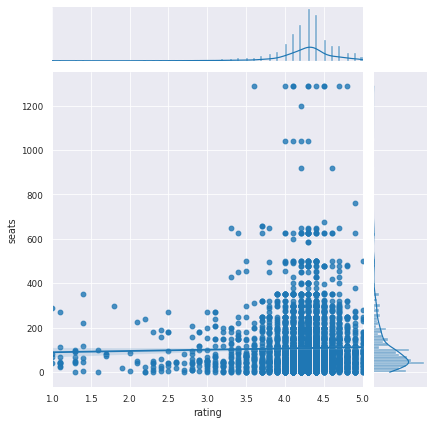

In [59]:
# смотрим, есть ли зависимость оценок от числа мест в заведении
sns.set_style('darkgrid') 
sns.set_context('paper')

sns.jointplot(x='rating', y='seats', data=data,kind='reg');

In [60]:
data[['rating','seats']].corr()

,rating,seats
rating,1.000000,0.021025
seats,0.021025,1.000000


Прямая корреляционная связь очень слабая. Распределение оценок близко к нормальному.

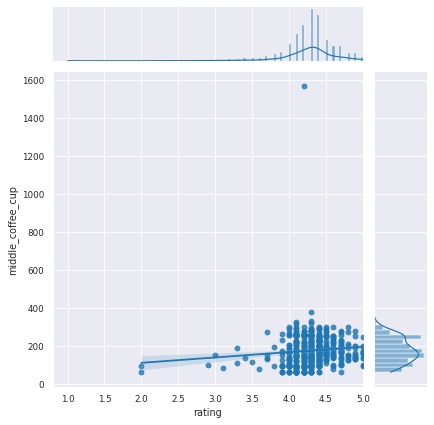

In [61]:
# смотрим, есть зависимость оценок от цены чашки кофе
sns.set_style('darkgrid') 
sns.set_context('paper')

sns.jointplot(x='rating', y='middle_coffee_cup', data=data, kind='reg');

In [62]:
data[['rating','middle_coffee_cup']].corr()

,rating,middle_coffee_cup
rating,1.000000,0.100447
middle_coffee_cup,0.100447,1.000000


Незначительная прямая связь присутствует. Распределение средней цены чашки кофе близко к нормальному.

<div class="alert alert-block alert-warning">
    

### Комментарий от ревьюера №32 (можно лучше)
В обоих случаях видим, что связь **отсутствует**. 
</div>

**На основании наблюдений можно дать следующие рекомендации:**

* кофейня является популярным форматом заведений (после кафе и ресторанов), 16.8% от всех заведений, поэтому именно этот формат можно рекомендовать

* предпочтительным районом для новой кофейни является центр Москвы. Большое число уже существующих заведений и высокий средний рейтинг говорит о востребованности заведений этой категории

* кофейни популярны на Проспекте мира, можно рекомендовать открывать новую на этой улице. Также варианты Ленинский проспект, Ленинградский проспект, Профсоюзная улица, Каширское шоссе	

* круглосуточные кофейни, похоже, не слишком востребованы, всего 4.2% от всех кофеен, на такой режим работы ориентироваться не стоит

* средняя цена чашки кофе в ЦАО около 188 рублей

* оптимальное число посадочных мест для кофейни - около 50

<div class="alert alert-block alert-success">
    

### Комментарий от ревьюера №33 (ОК)
Молодец, что приводишь такие развёрнутые и аргументированные рекомендации.
</div>

## Презентация
<a id="presentation"></a> 

Ссылка на презентацию - https://drive.google.com/file/d/1G0CsVy4EcnB0rZFxXIcUrOO__mCHfLFr/view?usp=sharing

<div class="alert alert-block alert-success">
    
### Комментарий от ревьюера №34 (ОК)
У тебя получилась удачная презентация:
    
- указан предмет исследования
- указаны временные рамки исследования
- есть общие выводы
- слайды не перегружены и информативны
- указаны источники данных
</div>

<div class="alert alert-block alert-danger">
    

### Комментарий от ревьюера №35 (необходимо исправить)
В презентации осталось доработать эти моменты:
- сделать заголовки слайдов более информативными (например, "Больше всего заведений - в центре" вместо "Расположение всех заведений в Москве")
- сделать выводы по каждой идее (слайду)
</div>

<div class="alert alert-block alert-success">
    
Проект нужно доработать:
- исправить ошибки при предобработке данных
- в ряде случаев изменить тип графика
- доработать презентацию
</div>

<div class="alert alert-block alert-info">
    

### Комментарий студента
Добавил исправления, обновил презентацию, ссылка - https://drive.google.com/file/d/1G0CsVy4EcnB0rZFxXIcUrOO__mCHfLFr/view?usp=sharing</div> 

<div class="alert alert-block alert-success">
    
(2) Привет! Спасибо за доработки, проект принят!
</div>